In [1]:
import tomli
import matplotlib.pyplot as plt
import numpy as np
import torch

from deep_generative_models.dataset import HDF5Dataset, create_dataloader
from config.paths import CELL_DATA, TRAIN_CONFIG

with open(TRAIN_CONFIG, "rb") as f:
    config = tomli.load(f)


In [2]:
data_loader = create_dataloader(hdf5_file_path=CELL_DATA,
                                brains = ["B01", "B02", "B05"],
                                tile_size = 256,
                                batch_size = 1000,
                                tiles_per_epoch = 10000,
                                num_workers = 0)

In [3]:
images = next(iter(data_loader))

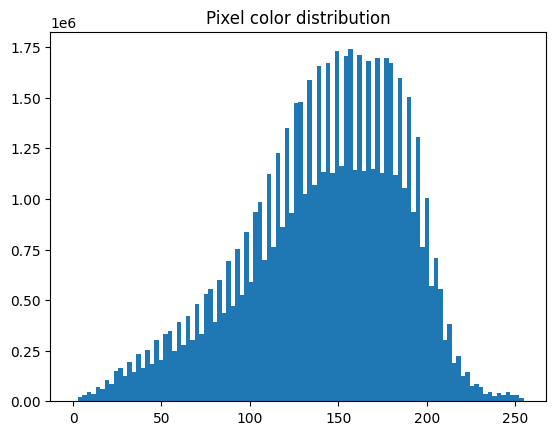

In [4]:
# plot pixel color distribution of images
plt.figure()
plt.hist(images.flatten(), bins=100)
plt.title("Pixel color distribution")
plt.show()

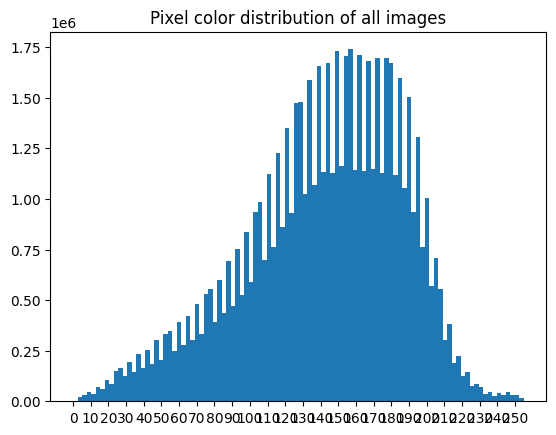

In [5]:
# Kombinieren Sie die Pixelwerte aller Bilder
all_pixels = np.concatenate([image.flatten() for image in images])

plt.figure()
plt.hist(all_pixels, bins=100)
plt.title("Pixel color distribution of all images")
# make every 10 x tick 
plt.xticks(np.arange(0, 256, 10))
plt.show()

In [10]:
len(images[images_outliers])

16

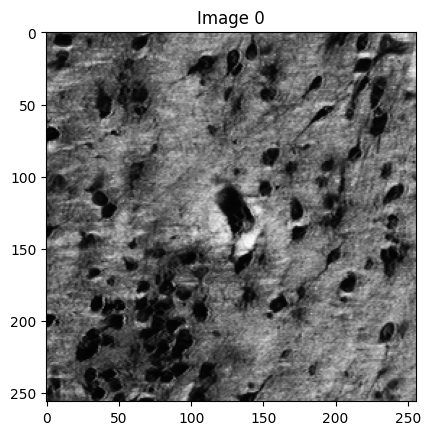

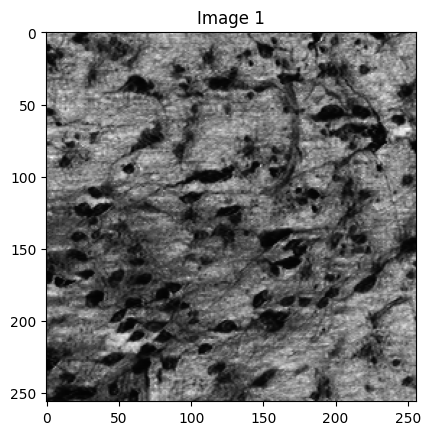

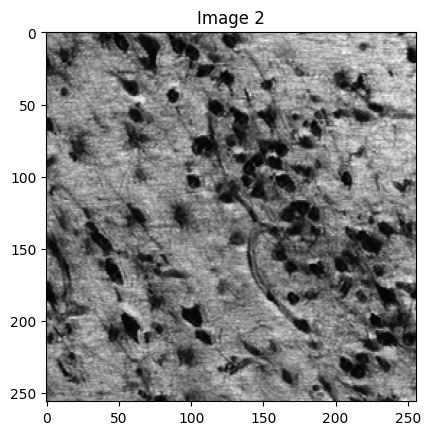

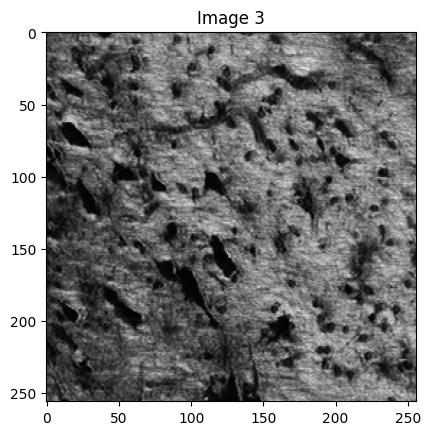

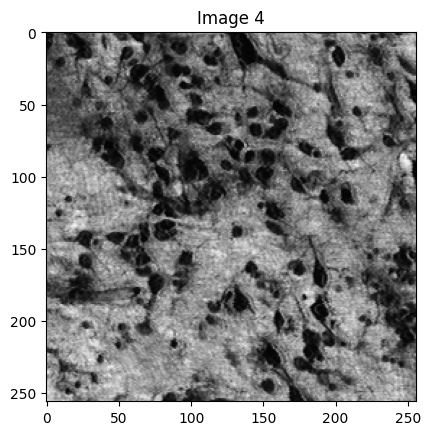

...

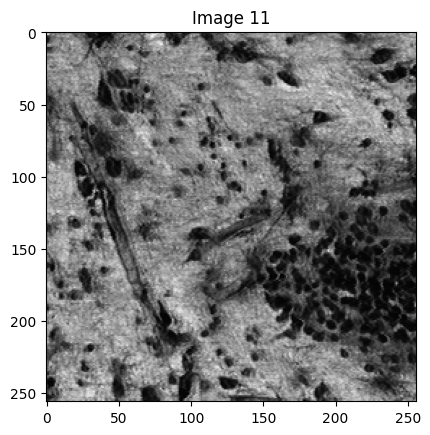

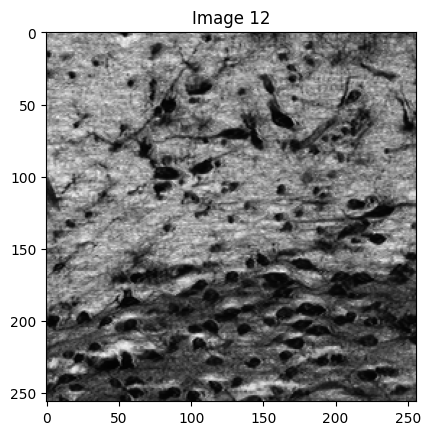

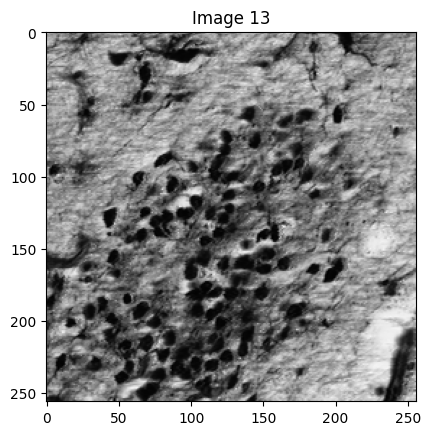

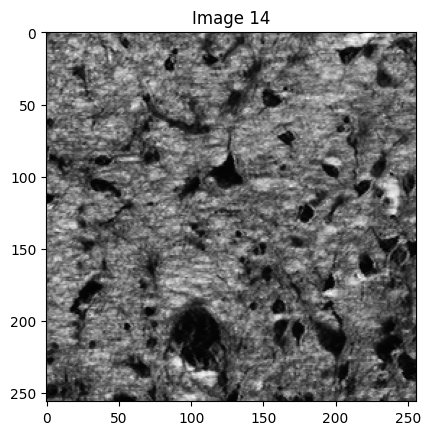

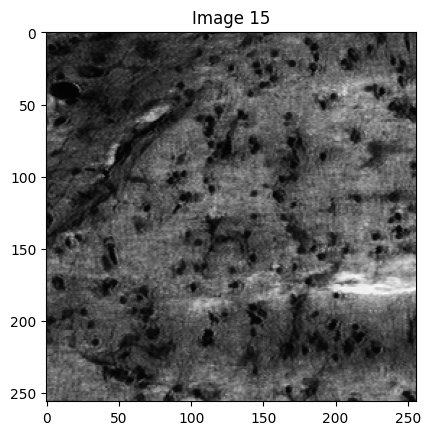

In [9]:
def find_outliers(images, lower_threshold, upper_threshold, percentage=0.1):
    # Find pixels below the lower threshold
    below_lower = images < lower_threshold
    # Find pixels above the upper threshold
    above_upper = images > upper_threshold
    
    # Count the number of pixels below the lower threshold per image
    below_lower_count = below_lower.sum(axis=(1, 2, 3))
    # Count the number of pixels above the upper threshold per image
    above_upper_count = above_upper.sum(axis=(1, 2, 3))
    
    # Determine if either condition exceeds the percentage threshold
    below_condition = below_lower_count > percentage * images.size(1) * images.size(2) * images.size(3)
    above_condition = above_upper_count > percentage * images.size(1) * images.size(2) * images.size(3)
    
    # Return images meeting either condition
    return below_condition | above_condition

# Example usage
images_outliers = find_outliers(images, lower_threshold=30, upper_threshold=230, percentage=0.1)

# Visualize the outlier images
for i, image in enumerate(images[images_outliers]):
    plt.figure()
    plt.imshow(image.permute(1, 2, 0), cmap="gray")
    plt.title(f"Image {i}")
    plt.show()


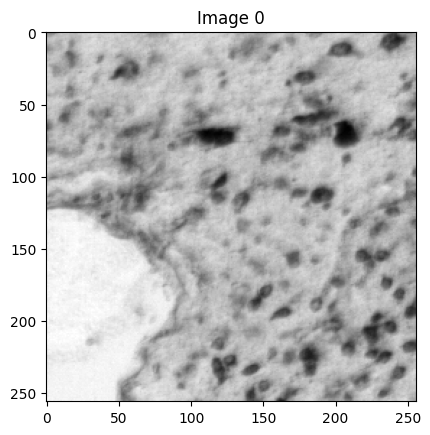

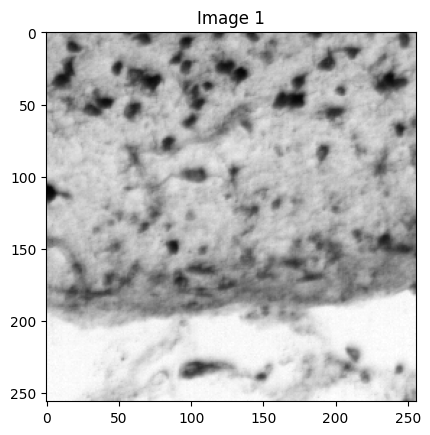

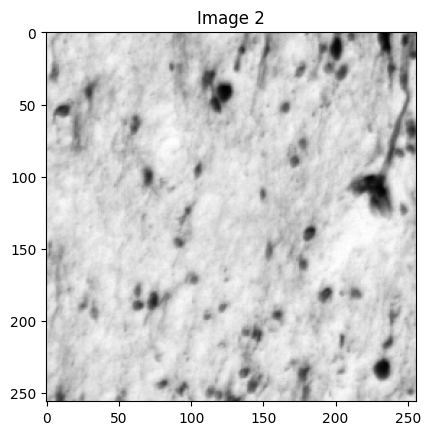

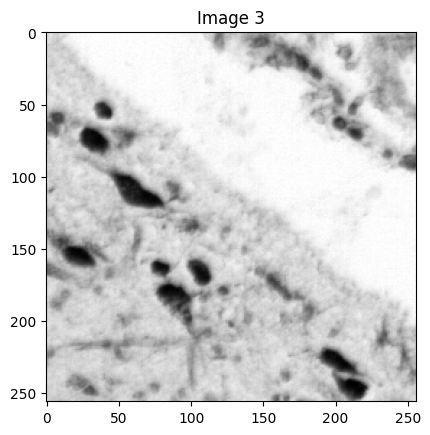

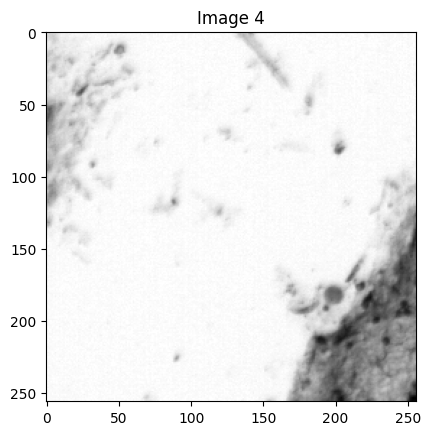

...

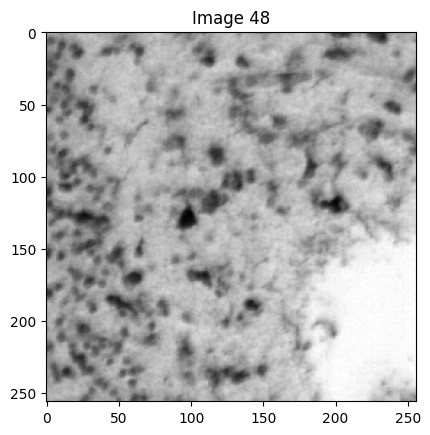

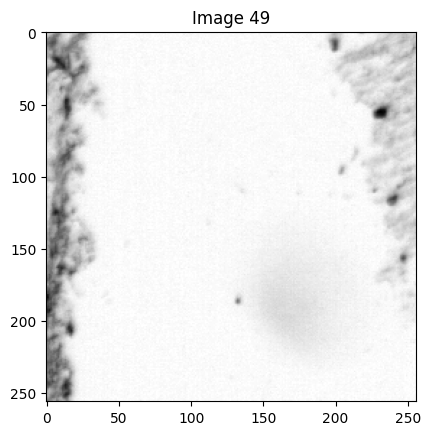

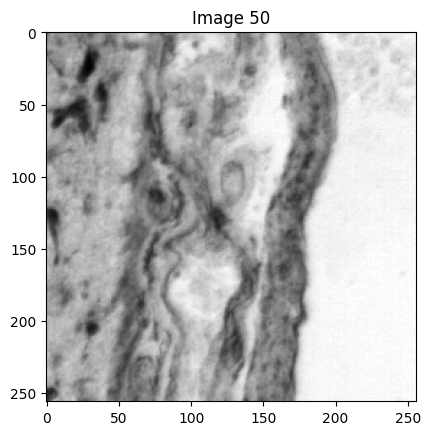

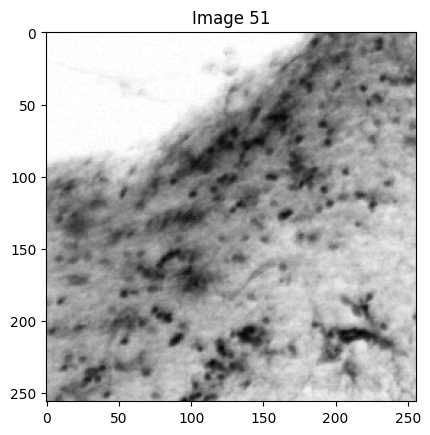

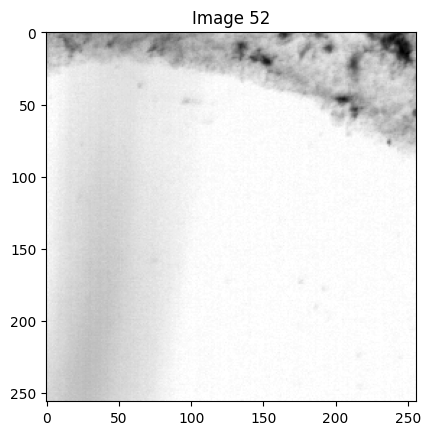

In [ ]:
def find_outliers(images, threshold, percentage=0.1): 
    below_threshold = images > threshold
    below_threshold_count = below_threshold.sum(axis=(1, 2, 3))
    return below_threshold_count > percentage * images.size(1) * images.size(2) * images.size(3)

images_below_threshold = find_outliers(images, 230)

for i, image in enumerate(images[images_below_threshold]):
    plt.figure()
    plt.imshow(image.permute(1, 2, 0), cmap="gray") 
    plt.title(f"Image {i}")
    plt.show()

        

/var/folders/qs/md0by3p95fs1y9pznxzwc2s80000gp/T/ipykernel_20116/177939137.py:19: UserWarning: tight_layout not applied: number of rows in subplot specifications must be multiples of one another.
  plt.tight_layout()


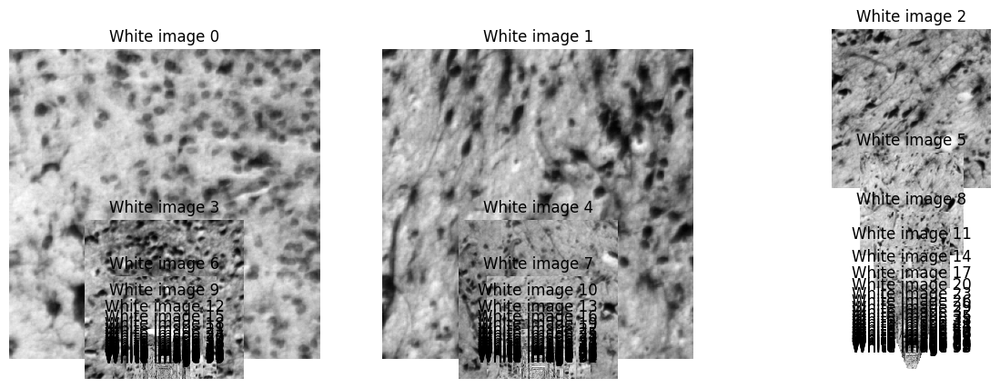

In [ ]:
# check if an images has more than 10% of its pixels as white

def _is_white(tile, threshold: float = 0.1) -> bool:
    """Check if the tile has a high proportion of white pixels."""
    return torch.mean((tile > 0.9).float()) > threshold

# plot white images
plt.figure(figsize=(15, 5))
white_images = []

for i, tile in enumerate(images):
    if _is_white(tile):
        white_images.append(tile)
        plt.imshow(tile.squeeze(), cmap="gray")
        plt.title(f"White image {i}")
        plt.axis("off")
        
plt.tight_layout()
plt.show()

In [ ]:
len(images), outliers

(5000, 171)

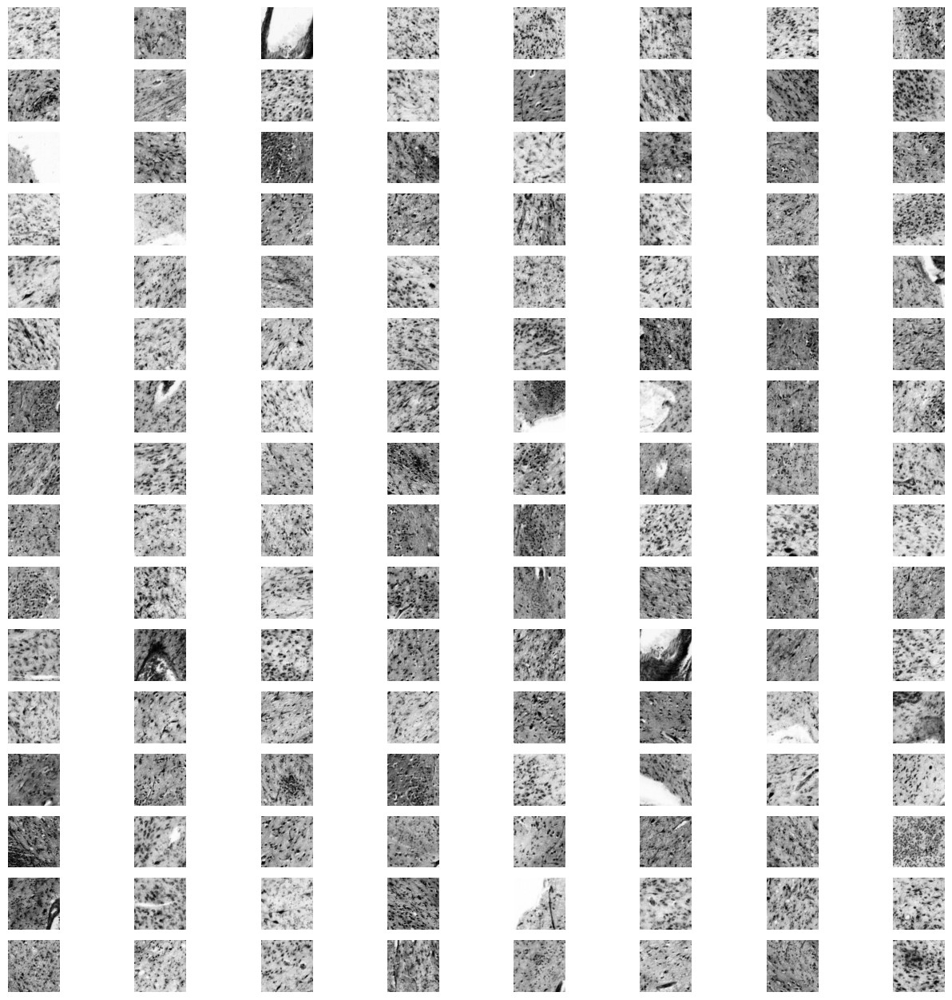

In [ ]:
images = next(iter(data_loader))

#plot all 128 images in the first batch
fig, ax = plt.subplots(16, 8, figsize=(16, 16))
for i in range(16):
    for j in range(8):
        ax[i, j].imshow(images[i*8+j].permute(1, 2, 0), cmap="gray")
        ax[i, j].axis("off")
plt.show()
    

    
    